In [2]:
#pip install geopy
#pip install minisom
#pip install folium
## for data
import numpy as np
import pandas as pd
## for plotting
import matplotlib.pyplot as plt
import seaborn as sns
## for geospatial
import folium
import geopy
## for machine learning
from sklearn import preprocessing, cluster
import scipy
## for deep learning
import minisom
import json
import geopandas as gpd

In [3]:
df = pd.read_csv('cleaned_data.csv', low_memory = False)

In [4]:
df = df.rename(columns={"area": "Area", "unformattedPrice": "Price", "addressCity": "City", "addressState": "State", "addressStreet": "Street Address", "homeType": "Type", "long": "Longitude", "lat": "Latitude"})

In [5]:
df.drop(columns = ['statusText', 'address', 'priceReductionRatio', 'priceReductionStr', 'has3DModel', 'hasVideo', 'hasAdditionalAttributions', 'addressZipcode','sgapt', 'isZillowOwned', 'lotAreaRaw', 'State'], inplace = True)

In [6]:
df

,Price,Street Address,City,beds,baths,Area,Type,Latitude,Longitude
0,565000.0,6648 Logan Ave,Fontana,4,3,2362.0,SINGLE_FAMILY,34.133167,-117.469734
1,520000.0,9508 Marcona Ave,Fontana,4,2,1362.0,SINGLE_FAMILY,34.081030,-117.468796
2,799900.0,17625 Hawthorne Ave,Fontana,5,3,2683.0,SINGLE_FAMILY,34.081074,-117.419740
3,519999.0,16562 Iris Dr,Fontana,3,2,1712.0,SINGLE_FAMILY,34.072838,-117.442580
4,580000.0,9577 Sultana Ave,Fontana,4,2,1564.0,SINGLE_FAMILY,34.079777,-117.469215
...,...,...,...,...,...,...,...,...,...
100765,215000.0,21 Shanley Ave,Newark,3,2,1737.0,LOT,40.726360,-74.205080
100766,250000.0,777 S 11th St,Newark,3,2,1737.0,LOT,40.726420,-74.207260
100767,700000.0,396 S 11th St,Newark,3,2,1737.0,LOT,40.739840,-74.201680
100768,1000000.0,13 Maybaum Ave,Newark,3,2,1737.0,LOT,40.746174,-74.214745


In [7]:
#df['Bed and Bath'] = df['beds']+df['baths']
df['Price per Sqft'] = df['Price'] / df['Area']
df['Price per Sqft'] = round(df['Price per Sqft'], 0)

In [8]:
df.drop(columns = ['beds', 'baths', 'Area', 'Price'], inplace = True)

In [9]:
dtf = df
dtf

,Street Address,City,Type,Latitude,Longitude,Price per Sqft
0,6648 Logan Ave,Fontana,SINGLE_FAMILY,34.133167,-117.469734,239.0
1,9508 Marcona Ave,Fontana,SINGLE_FAMILY,34.081030,-117.468796,382.0
2,17625 Hawthorne Ave,Fontana,SINGLE_FAMILY,34.081074,-117.419740,298.0
3,16562 Iris Dr,Fontana,SINGLE_FAMILY,34.072838,-117.442580,304.0
4,9577 Sultana Ave,Fontana,SINGLE_FAMILY,34.079777,-117.469215,371.0
...,...,...,...,...,...,...
100765,21 Shanley Ave,Newark,LOT,40.726360,-74.205080,124.0
100766,777 S 11th St,Newark,LOT,40.726420,-74.207260,144.0
100767,396 S 11th St,Newark,LOT,40.739840,-74.201680,403.0
100768,13 Maybaum Ave,Newark,LOT,40.746174,-74.214745,576.0


In [10]:
filter = "Houston"
dtf = dtf[dtf["City"]==filter][["City","Street Address","Longitude","Latitude", "Price per Sqft", "Type"]].reset_index(drop=True)
dtf = dtf.reset_index().rename(columns={"index":"id"})
dtf.head()

,id,City,Street Address,Longitude,Latitude,Price per Sqft,Type
0,0,Houston,9906 Ripple Lake Dr,-95.593640,29.918015,122.0,SINGLE_FAMILY
1,1,Houston,20918 Southvine Ct,-95.408775,29.997416,113.0,SINGLE_FAMILY
2,2,Houston,7623 Shangrila Ln,-95.662370,29.890629,118.0,SINGLE_FAMILY
3,3,Houston,11307 Stoney Meadow Dr,-95.660350,29.936144,147.0,SINGLE_FAMILY
4,4,Houston,16918 Lake Willowby Ln,-95.165580,29.968779,117.0,SINGLE_FAMILY


In [11]:
city = "Chicago"
## get location
locator = geopy.geocoders.Nominatim(user_agent="MyCoder")
location = locator.geocode(city)
print(location)
## keep latitude and longitude only
location = [location.latitude, location.longitude]
print("[lat, long]:", location)

Chicago, Cook County, Illinois, United States
[lat, long]: [41.8755616, -87.6244212]


In [12]:
df['Type'].unique()

array(['SINGLE_FAMILY', 'TOWNHOUSE', 'CONDO', 'MULTI_FAMILY', 'LOT',
       'MANUFACTURED', 'APARTMENT'], dtype=object)

In [13]:
x, y = "Latitude", "Longitude"
color = "Type"
size = "Price per Sqft"
popup = "Street Address"
data = dtf.copy()

## create color column
lst_colors=["red","green","orange","purple","black","blue", "yellow"]
lst_elements = sorted(list(dtf[color].unique()))
data["color"] = data[color].apply(lambda x: 
                lst_colors[lst_elements.index(x)])
## create size column (scaled)
scaler = preprocessing.MinMaxScaler(feature_range=(3,15))
data["size"] = scaler.fit_transform(
               data[size].values.reshape(-1,1)).reshape(-1)

## initialize the map with the starting location
map_ = folium.Map(location=location, tiles="cartodbpositron",
                  zoom_start=11)
## add points
data.apply(lambda row: folium.CircleMarker(
           location=[row[x],row[y]], popup=row[popup],
           color=row["color"], fill=True,
           radius=row["size"]).add_to(map_), axis=1)
## add html legend
legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:8px;">&nbsp;<b>"""+color+""":</b><br>"""
for i in lst_elements:
     legend_html = legend_html+"""&nbsp;<i class="fa fa-circle 
     fa-1x" style="color:"""+lst_colors[lst_elements.index(i)]+"""">
     </i>&nbsp;"""+str(i)+"""<br>"""
legend_html = legend_html+"""</div>"""
map_.get_root().html.add_child(folium.Element(legend_html))

## plot the map
map_

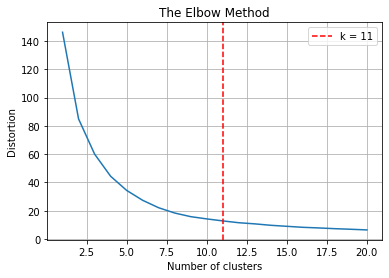

In [14]:
X = dtf[["Latitude","Longitude"]]
max_k = 20

## iterations
distortions = [] 
for i in range(1, max_k+1):
    if len(X) >= i:
       model = cluster.KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
       model.fit(X)
       distortions.append(model.inertia_)
    
## best k: the lowest derivative
k = [i*100 for i in np.diff(distortions,2)].index(min([i*100 for i 
     in np.diff(distortions,2)]))
## plot
fig, ax = plt.subplots()
ax.plot(range(1, len(distortions)+1), distortions)
ax.axvline(k, ls='--', color="red", label="k = "+str(k))
ax.set(title='The Elbow Method', xlabel='Number of clusters', 
       ylabel="Distortion")
ax.legend()
ax.grid(True)
plt.show()

In [15]:
# K-Means when k=7
k = 11
model = cluster.KMeans(n_clusters=k, init='k-means++')
X = dtf[["Latitude","Longitude"]]
## clustering
dtf_X = X.copy()
dtf_X["cluster"] = model.fit_predict(X)
## find real centroids
closest, distances = scipy.cluster.vq.vq(model.cluster_centers_, 
                     dtf_X.drop("cluster", axis=1).values)
dtf_X["centroids"] = 0
for i in closest:
    dtf_X["centroids"].iloc[i] = 1
## add clustering info to the original dataset
dtf[["cluster","centroids"]] = dtf_X[["cluster","centroids"]]

C:\Users\10022\AppData\Local\Temp\ipykernel_37968\1711113958.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dtf_X["centroids"].iloc[i] = 1


In [28]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
%matplotlib inline

In [29]:
label=model.fit_predict(X)
print(silhouette_score(X, label))

0.44392919087801824


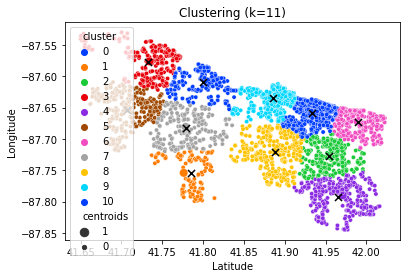

In [32]:
## plot
fig, ax = plt.subplots()
sns.scatterplot(x="Latitude", y="Longitude", data=dtf, 
                palette=sns.color_palette("bright",k),
                hue='cluster', size="centroids", size_order=[1,0],
                legend="brief", ax=ax).set_title('Clustering (k='+str(k)+')')
th_centroids = model.cluster_centers_
ax.scatter(th_centroids[:,0], th_centroids[:,1], s=50, c='black', marker="x")

In [16]:
dtf

,id,City,Street Address,Longitude,Latitude,Price per Sqft,Type,cluster,centroids
0,0,Houston,9906 Ripple Lake Dr,-95.593640,29.918015,122.0,SINGLE_FAMILY,0,0
1,1,Houston,20918 Southvine Ct,-95.408775,29.997416,113.0,SINGLE_FAMILY,4,0
2,2,Houston,7623 Shangrila Ln,-95.662370,29.890629,118.0,SINGLE_FAMILY,10,0
3,3,Houston,11307 Stoney Meadow Dr,-95.660350,29.936144,147.0,SINGLE_FAMILY,10,0
4,4,Houston,16918 Lake Willowby Ln,-95.165580,29.968779,117.0,SINGLE_FAMILY,3,0
...,...,...,...,...,...,...,...,...,...
4951,4951,Houston,9230 Talton St,-95.253296,29.843720,118.0,MULTI_FAMILY,8,0
4952,4952,Houston,6909 Ardmore St,-95.377335,29.698145,161.0,TOWNHOUSE,9,0
4953,4953,Houston,12500 Sandpiper Dr APT 72,-95.503880,29.640875,74.0,CONDO,6,0
4954,4954,Houston,10510 Wolbrook St,-95.305580,29.864647,143.0,SINGLE_FAMILY,8,0


In [17]:
# Apply affinity propagation
model = cluster.AffinityPropagation()

Text(0.5, 1.0, 'Clustering(k=11)')

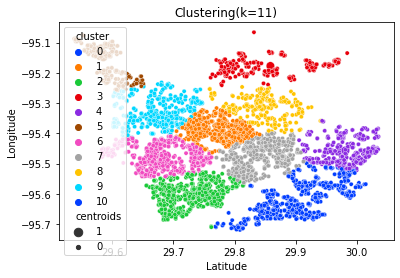

In [18]:
k = dtf["cluster"].nunique()
sns.scatterplot(x="Latitude", y="Longitude", data=dtf, 
                palette=sns.color_palette("bright",k),
                hue='cluster', size="centroids", size_order=[1,0],
                legend="brief").set_title('Clustering(k='+str(k)+')')

In [19]:
#dtf.to_csv('K-Means.csv', index=False)

C:\Users\10022\AppData\Local\Temp\ipykernel_32380\563370721.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dtf_X["centroids"].iloc[i] = 1


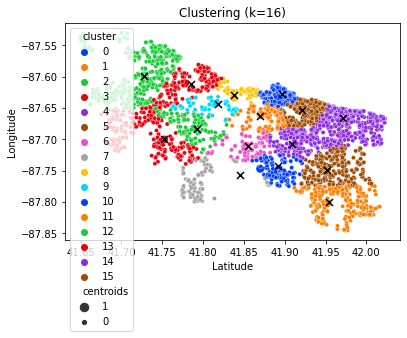

In [20]:
# Use SOMs
X = dtf[["Latitude","Longitude"]]
map_shape = (4,4)
## scale data
scaler = preprocessing.StandardScaler()
X_preprocessed = scaler.fit_transform(X.values)
## clustering
model = minisom.MiniSom(x=map_shape[0], y=map_shape[1], input_len=X.shape[1])
model.train_batch(X_preprocessed, num_iteration=100, verbose=False)
## build output dataframe
dtf_X = X.copy()
dtf_X["cluster"] = np.ravel_multi_index(np.array([model.winner(x) for x in X_preprocessed]).T, dims=map_shape)
## find real centroids
cluster_centers = np.array([vec for center in model.get_weights() for vec in center])
closest, distances = scipy.cluster.vq.vq(cluster_centers, X_preprocessed)
dtf_X["centroids"] = 0
for i in closest:
    dtf_X["centroids"].iloc[i] = 1
## add clustering info to the original dataset
dtf[["cluster","centroids"]] = dtf_X[["cluster","centroids"]]
## plot
k = dtf["cluster"].nunique()
fig, ax = plt.subplots()
sns.scatterplot(x="Latitude", y="Longitude", data=dtf, 
                palette=sns.color_palette("bright",k),
                hue='cluster', size="centroids", size_order=[1,0],
                legend="brief", ax=ax).set_title('Clustering (k='+str(k)+')')
th_centroids = scaler.inverse_transform(cluster_centers)
ax.scatter(th_centroids[:,0], th_centroids[:,1], s=50, c='black', marker="x")

In [21]:
#dtf.to_csv('SOMs.csv', index=False)

In [19]:
x, y = "Latitude", "Longitude"
color = "cluster"
size = "Price per Sqft"
popup = "Street Address"
marker = "centroids"
data = dtf.copy()
## create color column
lst_elements = sorted(list(dtf[color].unique()))
lst_colors = ['#%06X' % np.random.randint(0, 0xFFFFFF) for i in 
              range(len(lst_elements))]
data["color"] = data[color].apply(lambda x: 
                lst_colors[lst_elements.index(x)])
## create size column (scaled)
scaler = preprocessing.MinMaxScaler(feature_range=(3,15))
data["size"] = scaler.fit_transform(
               data[size].values.reshape(-1,1)).reshape(-1)
## initialize the map with the starting location
map_ = folium.Map(location=location, tiles="cartodbpositron",
                  zoom_start=12)
## add points
data.apply(lambda row: folium.CircleMarker(
           location=[row[x],row[y]], popup=row[popup],
           color=row["color"], fill=True,
           radius=row["size"]).add_to(map_), axis=1)
## add html legend
legend_html = """<div style="position:fixed; bottom:10px; left:10px; border:2px solid black; z-index:9999; font-size:14px;">&nbsp;<b>"""+color+""":</b><br>"""
for i in lst_elements:
     legend_html = legend_html+"""&nbsp;<i class="fa fa-circle 
     fa-1x" style="color:"""+lst_colors[lst_elements.index(i)]+"""">
     </i>&nbsp;"""+str(i)+"""<br>"""
legend_html = legend_html+"""</div>"""
map_.get_root().html.add_child(folium.Element(legend_html))
## add centroids marker
lst_elements = sorted(list(dtf[marker].unique()))
data[data[marker]==1].apply(lambda row: 
           folium.Marker(location=[row[x],row[y]], 
           popup=row[marker], draggable=False,          
           icon=folium.Icon(color="black")).add_to(map_), axis=1)
## plot the map
map_